In [13]:
import SimpleITK as sitk
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import patches
import shutil

In [63]:
ROOT_DIR = "/pylon5/ac5616p/Data/HeartSegmentationProject/CAP_challenge/CAP_challenge_training_set/test2/"
os.chdir(ROOT_DIR)

fixed="081028_BC77WB_FS"
moving=["090721_BB66KB_FS",
        "081028_XE45TK_FS",
        "081028_YY28TK_FS",
        "081030_NC89WB_FS",
        "081101_HG45HB_FS",
        "081101_JE65DB_FS",
        "081101_NK25FK_FS",
        "081101_XC45YB_FS",
        "081104_CK37CB_FS",
        "081104_UG89XK_FS"]

pixels_on_fixed=[[110,97,102],
                [147,97,98],
                [107,103,96],
                [148,103,91],
                [129,91,114]]

# Used for online registering
class ImagePair:
    def __init__(self, fixed_patient, moving_patient):
        self.fixed_patient=fixed_patient
        self.moving_patient=moving_patient
        self.fixed_image = sitk.ReadImage(ROOT_DIR + "Brain2NIFI/" + self.fixed_patient + "/norm.nii")
        self.moving_image = sitk.ReadImage(ROOT_DIR + "Brain2NIFI/" + self.moving_patient + "/norm.nii")
        self.fixed_array=sitk.GetArrayFromImage(self.fixed_image)
        self.moving_array=sitk.GetArrayFromImage(self.moving_image)
        self.reg_dir='results_for_online_tune/'+fixed_patient+'-'+moving_patient
        if (os.path.exists(self.reg_dir) == False):
            os.mkdir(self.reg_dir)
            self.register_images()
        else:
            self.parse_registration()
    
    def register_images(self):
        
        elastixImageFilter = sitk.ElastixImageFilter()
        elastixImageFilter.SetFixedImage(self.fixed_image)
        elastixImageFilter.SetMovingImage(self.moving_image)

        parameterMapVector = sitk.VectorOfParameterMap()
        paff=sitk.GetDefaultParameterMap("affine")
        pbsp = sitk.GetDefaultParameterMap("bspline")
        
        paff['DefaultPixelValue'] = ['0']
        pbsp['DefaultPixelValue'] = ['0']
        paff['AutomaticTransformInitialization'] = ['true']
        paff['AutomaticTransformInitializationMethod'] = ['CenterOfGravity']
        paff['NumberOfSamplesForExactGradient'] = ['100000']
        pbsp['NumberOfSamplesForExactGradient'] = ['100000']
        paff['NumberOfSpatialSamples'] = ['5000']
        pbsp['NumberOfSpatialSamples'] = ['5000']
        paff['NumberOfHistogramBins'] = ['32', '64', '256', '512']
        paff['MaximumNumberOfIterations'] = ['512']
        pbsp['MaximumNumberOfIterations'] = ['512']
        pbsp['NumberOfResolutions'] = ['4']
        paff['GridSpacingSchedule'] = ['6', '4', '2', '1.000000']
        pbsp['GridSpacingSchedule'] = ['6', '4', '2', '1.0']
        pbsp['FinalGridSpacingInPhysicalUnits'] = ['4', '4', '4']
        pbsp['FinalBSplineInterpolationOrder'] = ['2']
        
        parameterMapVector.append(paff)
        parameterMapVector.append(pbsp)
        elastixImageFilter.SetParameterMap(parameterMapVector)
        elastixImageFilter.Execute()
        output_path=self.reg_dir+'/result.nii'
        sitk.WriteImage(elastixImageFilter.GetResultImage(), output_path)
        
        transformParameterMap = elastixImageFilter.GetTransformParameterMap()
        transformixImageFilter = sitk.TransformixImageFilter()
        transformixImageFilter.SetTransformParameterMap(transformParameterMap)
        self.transformixImageFilter=transformixImageFilter
        
        shutil.move("TransformParameters.0.txt", self.reg_dir + "/TransformParameters.0.txt")
        shutil.move("TransformParameters.1.txt", self.reg_dir + "/TransformParameters.1.txt")
#         shutil.move("TransformParameters.2.txt", self.reg_dir + "/TransformParameters.2.txt")
    
    def parse_registration(self):
        param0=sitk.ReadParameterFile(self.reg_dir+"/TransformParameters.0.txt")
        param1=sitk.ReadParameterFile(self.reg_dir+"/TransformParameters.1.txt")
#         param2=sitk.ReadParameterFile(self.reg_dir+"/TransformParameters.2.txt")
        transformixImageFilter=sitk.TransformixImageFilter()
        transformixImageFilter.AddTransformParameterMap(param0)
        transformixImageFilter.AddTransformParameterMap(param1)
        transformixImageFilter.AddTransformParameterMap(param2)
        self.transformixImageFilter=transformixImageFilter

    def register_points(self, test_file='test.pts'):
        if os.path.exists('outputpoints.txt'):
            os.remove('outputpoints.txt')
        self.transformixImageFilter.SetFixedPointSetFileName(test_file)
        self.transformixImageFilter.SetMovingImage(self.moving_image)
        self.transformixImageFilter.Execute()
        
def plot_points_on_grid(x,y,z,array):
    '''x,y,z are indices, not pixel coordinates'''
    
    fig,[ax1, ax2, ax3]=plt.subplots(1,3,figsize=(15,15))

    # along x axis
    ax1.imshow(array[x,:,:],origin="lower")
    rect=patches.Rectangle((z-15,y-15),30,30,facecolor='none',edgecolor='r')
    ax1.plot(z,y,'o')
    ax1.add_patch(rect)
    
    # along y axis
    ax2.imshow(array[:,y,:],origin="lower")
    rect=patches.Rectangle((z-15,x-15),30,30,facecolor='none',edgecolor='r')
    ax2.plot(z,x,'o')
    ax2.add_patch(rect)
    
    # along z axis
    ax3.imshow(array[:,:,z],origin="lower")
    rect=patches.Rectangle((y-15,x-15),30,30,facecolor='none',edgecolor='r')
    ax3.plot(y,x,'o')
    ax3.add_patch(rect)
    
    plt.show()
    
def get_output_pixels(filename='outputpoints.txt'):
    fr = open(filename, 'r')
    res = None
    for line in fr.readlines():
        # Todo: make sure whether we should use OutputIndexMoving or OutputIndexFixed
        # modify the following line, seems to fix the bug

        line = line[line.index('OutputIndexMoving = ') + len('OutputIndexMoving = '):]
        line = line[:line.index('\n')].lstrip('[').rstrip(']')
        array = np.fromstring(line, dtype=int, sep=' ')
        if res is None:
            res = array.reshape(1, 3)
        else:
            res = np.concatenate((res, array.reshape(1, 3)), 0)
    return res

def pixel_to_point(pixel):
    return pixel[2]-1, pixel[1]-1,pixel[0]-1

def find_point(image_pair, pixel):
    # 1) write the pixel to file
    if os.path.exists('test.pts'):
        os.remove('test.pts')
    fr = open('test.pts', 'w')
    fr.write('index'+'\n'+str(1)+'\n'+str(pixel[0])+' '+str(pixel[1])+' '+str(pixel[2]))
    fr.close()

    # find the corresponding point
    image_pair.register_points()
    return get_output_pixels()[0]

In [64]:
image_pairs=[]
moving_arrays=[]
for moving_image in moving:
    image_pair=ImagePair(fixed_patient=fixed, moving_patient=moving_image)
    image_pairs.append(image_pair)
    moving_arrays.append(image_pair.moving_array)
fixed_array=image_pairs[0].fixed_array

results_for_online_tune/081028_BC77WB_FS-090721_BB66KB_FS
results_for_online_tune/081028_BC77WB_FS-081028_XE45TK_FS
results_for_online_tune/081028_BC77WB_FS-081028_YY28TK_FS
results_for_online_tune/081028_BC77WB_FS-081030_NC89WB_FS
results_for_online_tune/081028_BC77WB_FS-081101_HG45HB_FS
results_for_online_tune/081028_BC77WB_FS-081101_JE65DB_FS
results_for_online_tune/081028_BC77WB_FS-081101_NK25FK_FS
results_for_online_tune/081028_BC77WB_FS-081101_XC45YB_FS
results_for_online_tune/081028_BC77WB_FS-081104_CK37CB_FS
results_for_online_tune/081028_BC77WB_FS-081104_UG89XK_FS


In [46]:
def plot_one_pixel_on_all_moving_images(fixed_array, moving_arrays, fixed_pixel, moving_pixels,name):
    '''each moving_pixel in moving_pixels corresponds to each array in moving_arrays'''
    fig,axs=plt.subplots(len(moving_arrays)+1,3,figsize=(20,60))
    fig.suptitle('correspondence for' + str(fixed_pixel))
    
    '''plot fixed'''
    x,y,z=pixel_to_point(fixed_pixel)
    # along x axis
    axs[0,0].imshow(fixed_array[x,:,:],origin="lower")
    rect=patches.Rectangle((z-15,y-15),30,30,facecolor='none',edgecolor='r')
    axs[0,0].plot(z,y,'o')
    axs[0,0].add_patch(rect)
    axs[0,0].set_title('fixed '+str(fixed_pixel))
    
    # along y axis
    axs[0,1].imshow(fixed_array[:,y,:],origin="lower")
    rect=patches.Rectangle((z-15,x-15),30,30,facecolor='none',edgecolor='r')
    axs[0,1].plot(z,x,'o')
    axs[0,1].add_patch(rect)
    
    # along z axis
    axs[0,2].imshow(fixed_array[:,:,z],origin="lower")
    rect=patches.Rectangle((y-15,x-15),30,30,facecolor='none',edgecolor='r')
    axs[0,2].plot(y,x,'o')
    axs[0,2].add_patch(rect)
    
    '''plot moving'''
    for i in range(len(moving_arrays)):
        moving_array=moving_arrays[i]
        x,y,z=pixel_to_point(moving_pixels[i])
        moving_name=moving[i]
        
        # along x axis
        axs[i+1,0].imshow(moving_array[x,:,:],origin="lower")
        rect=patches.Rectangle((z-15,y-15),30,30,facecolor='none',edgecolor='r')
        axs[i+1,0].plot(z,y,'o')
        axs[i+1,0].add_patch(rect)
        axs[i+1,0].set_title(moving_name+str(moving_pixels[i]))

        # along y axis
        axs[i+1,1].imshow(moving_array[:,y,:],origin="lower")
        rect=patches.Rectangle((z-15,x-15),30,30,facecolor='none',edgecolor='r')
        axs[i+1,1].plot(z,x,'o')
        axs[i+1,1].add_patch(rect)

        # along z axis
        axs[i+1,2].imshow(moving_array[:,:,z],origin="lower")
        rect=patches.Rectangle((y-15,x-15),30,30,facecolor='none',edgecolor='r')
        axs[i+1,2].plot(y,x,'o')
        axs[i+1,2].add_patch(rect)
    
    plt.savefig(name)

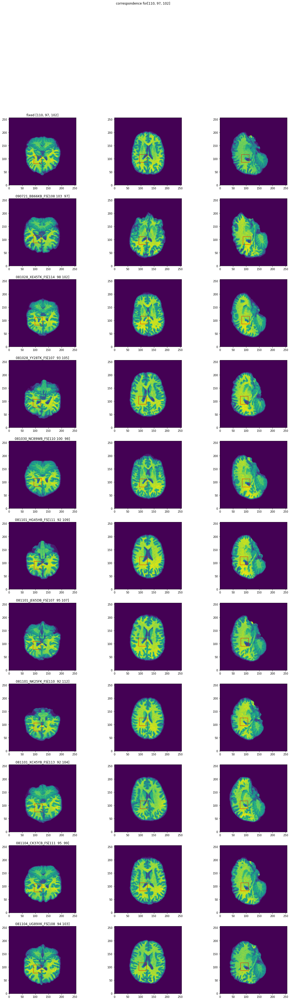

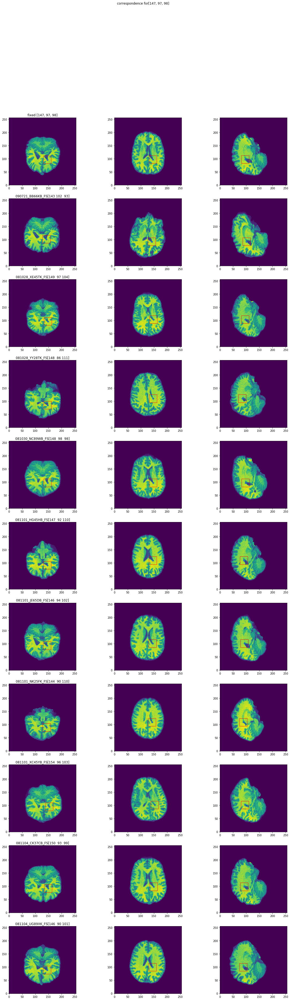

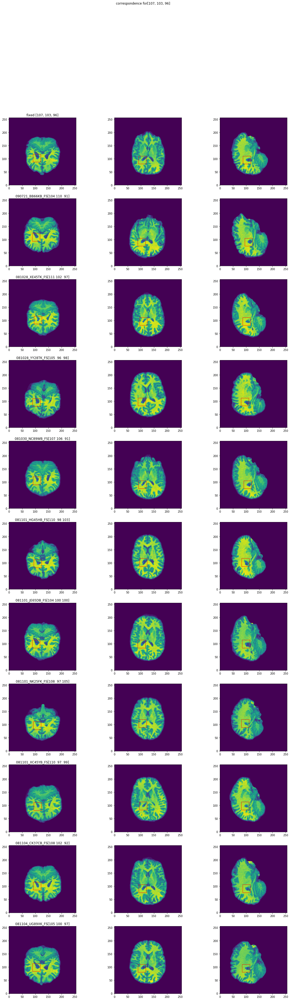

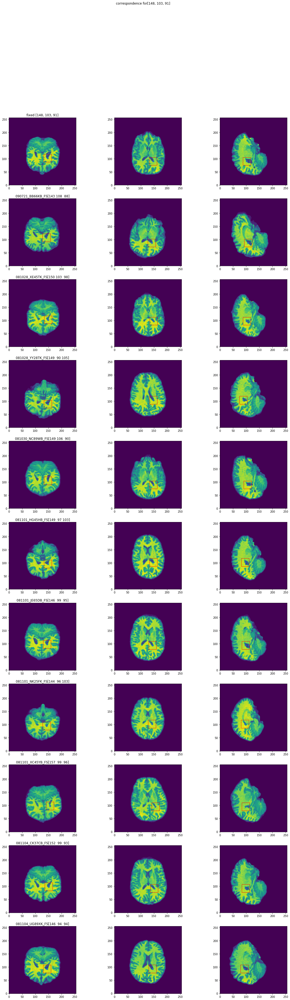

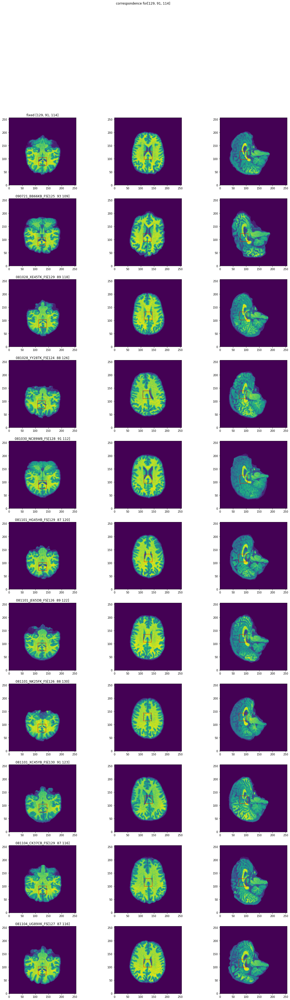

In [65]:
for i in range(len(pixels_on_fixed)):
    pixel=pixels_on_fixed[i]
    x,y,z=pixel_to_point(pixel)
    moving_pixels=[]
    for image_pair in image_pairs:
        moving_pixels.append(find_point(image_pair, pixel))
    
    name=str(i)+'.jpg'
    plot_one_pixel_on_all_moving_images(fixed_array,moving_arrays,pixel,moving_pixels, name)

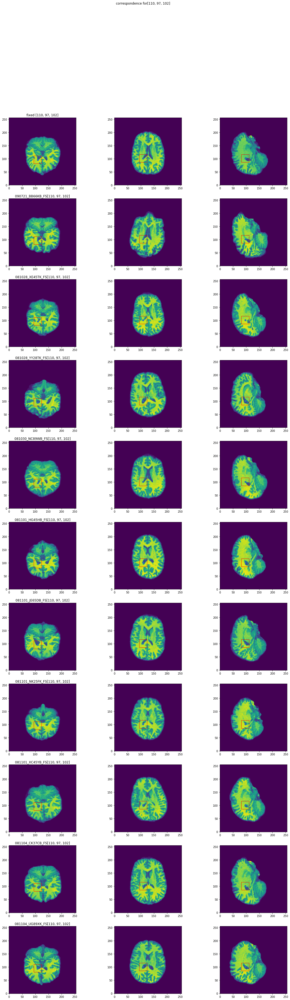

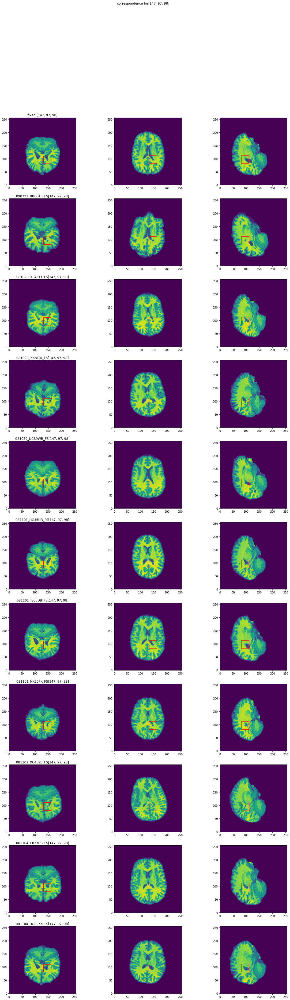

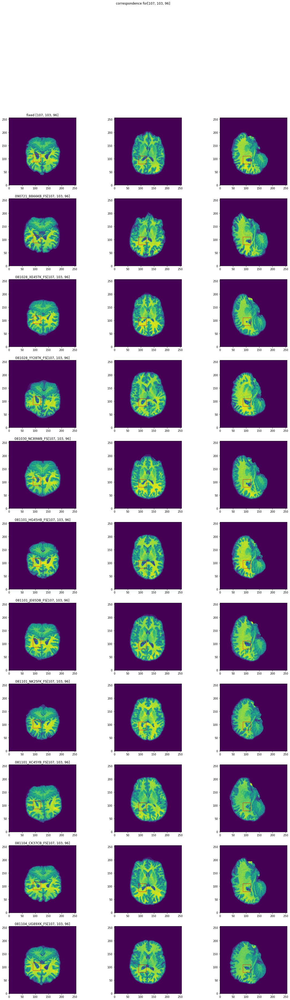

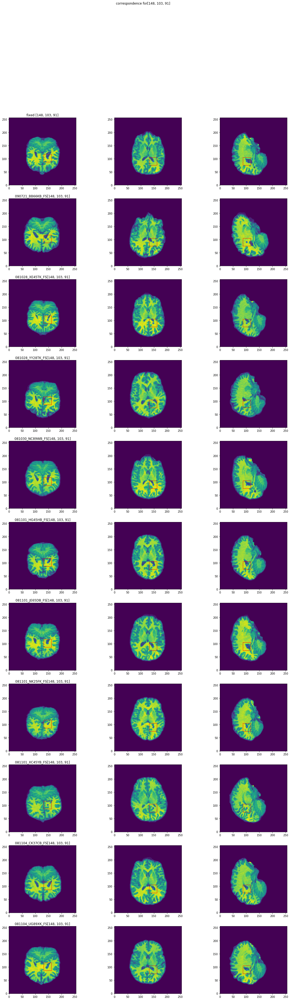

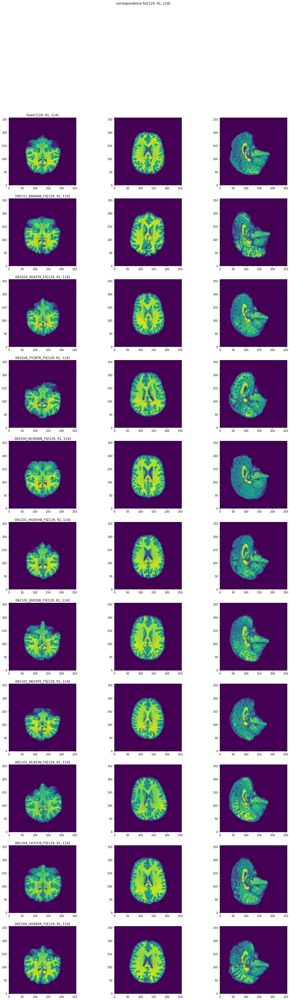

In [53]:
for i in range(len(pixels_on_fixed)):
    pixel=pixels_on_fixed[i]
    plot_one_pixel_on_all_moving_images(fixed_array,moving_arrays,pixel,[pixel]*10, 'test_'+str(i)+'.jpg')